# Visual Search Examples
<img src="https://github.com/retkowsky/images/blob/master/cohere4.jpg?raw=true" width=400>
This notebook demonstrates practical implementation of multimodal visual search capabilities using Azure AI Search and Cohere embeddings. It showcases how to perform semantic search across a fashion catalog using both natural language queries and image-based searches, including multilingual query support.

The notebook provides end-to-end examples of querying a pre-built Azure AI Search index with vector embeddings, combining text-to-image search and image-to-image search for comprehensive visual discovery workflows.

The notebook demonstrates three core capabilities:
- Text-Based Visual Search - Find fashion items using natural language descriptions in multiple languages
- Image-Based Visual Search - Discover similar items using an image as the query
- Multilingual Support - Search with prompts in English, Arabic, Chinese, and French
- Results Visualization - Display ranked results with similarity scores in a grid layout

In [1]:
import io
import json
import matplotlib.pyplot as plt
import os
import requests
import sys
import time

from azure.ai.inference import EmbeddingsClient, ImageEmbeddingsClient
from azure.ai.inference.models import ImageEmbeddingInput
from azure.core.credentials import AzureKeyCredential
from azure.search.documents import SearchClient
from azure.search.documents.indexes import SearchIndexClient, SearchIndexerClient
from azure.search.documents.indexes.models import (
    SearchIndexerDataContainer,
    SearchIndexerDataSourceConnection,
    VectorSearch,
)
from azure.search.documents.models import VectorizedQuery
from azure.storage.blob import BlobServiceClient
from datetime import datetime
from dotenv import load_dotenv
from PIL import Image

In [2]:
print(f"Python version: {sys.version}")

Python version: 3.10.18 (main, Jun  5 2025, 13:14:17) [GCC 11.2.0]


In [3]:
print(f"Today is {datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 11-Dec-2025 10:57:06


# Settings

In [4]:
load_dotenv("azure.env")

# Cohere Embed v4 deployed in Microsoft Foundry
api_key = os.getenv("api_key")
endpoint = os.getenv("endpoint")

# Azure AI Search
azure_search_endpoint = os.getenv("azure_search_endpoint")
azure_search_key = os.getenv("azure_search_key")

# Azure storage account
blob_connection_string = os.getenv("blob_connection_string")
container_name = os.getenv("container_name")

deployment_name = "embed-v-4-0"  # name of Cohere Embed 4 model as deployed in Microsoft Foundry
index_name = "fashion-demo-2025"

In [5]:
# Azure AI search client
search_client = SearchClient(azure_search_endpoint, index_name,
                             AzureKeyCredential(azure_search_key))

In [6]:
text_client = EmbeddingsClient(endpoint=endpoint,
                               credential=AzureKeyCredential(api_key),
                               model=deployment_name)

In [7]:
image_client = ImageEmbeddingsClient(
    endpoint=endpoint,
    credential=AzureKeyCredential(api_key),
    model=deployment_name,
)

# Helper

In [8]:
def get_text_embeddings(text: str) -> list[float]:
    """
    Generate text embeddings using Cohere V4 embedding model.
    
    Converts input text into a dense vector representation (embedding) that
    captures semantic meaning, suitable for similarity comparisons, clustering,
    or retrieval tasks. Uses the configured deployment and text client for
    Azure OpenAI API access.
    
    Args:
        text (str): The input text to embed. Must not be empty or whitespace-only.
    
    Returns:
        list[float]: A list of floats representing the embedding vector for the input text.
    """
    if not text or not text.strip():
        raise ValueError("Input text cannot be empty")

    try:
        response = text_client.embed(
            input=[text.strip()],
            model=deployment_name,
        )
        return response.data[0].embedding
        
    except Exception as e:
        print("❌ Error")
        logging.error(f"Failed to generate embeddings: {e}")
        raise

In [9]:
def get_local_image_embeddings(image_path: str) -> list[float]:
    """
    Generate embeddings for a local image file using Cohere Embed 4.
    
    Converts an image file into a dense vector representation (embedding) that
    captures visual content and semantic meaning. The embedding can be used for
    image similarity comparisons, visual search, or multimodal retrieval tasks.
    
    Args:
        image_path (str): The file path to a local JPG image file to embed.
    
    Returns:
        list[float]: A list of floats representing the embedding vector for the input image.
    """
    try:
        image_input = ImageEmbeddingInput.load(
            image_file=image_path,
            image_format="jpg",
        )
        response = image_client.embed(input=[image_input])
        return response.data[0].embedding
        
    except Exception as e:
        print("❌ Error")
        logging.error(f"Failed to generate embeddings: {e}")
        raise

In [10]:
def get_image_embeddings_from_blob(blob_name: str) -> list[float]:
    """
    Generate embeddings with Cohere Embed 4 for an image stored in Azure Blob Storage.
    
    Downloads an image blob to a temporary local file, generates embeddings using
    Cohere Embed 4, and cleans up the temporary file. This function
    bridges blob storage access with the embedding generation pipeline for images
    hosted in cloud storage.
    
    Args:
        blob_name (str): The name/path of the image blob in the configured container.
    
    Returns:
        list[float]: A list of floats representing the embedding vector for the blob image.
    """
    try:
        # Download blob to temporary file
        blob_service_client = BlobServiceClient.from_connection_string(
            blob_connection_string)
        blob_client = blob_service_client.get_blob_client(
            container=container_name, blob=blob_name)

        # Create temp file with proper extension
        with tempfile.NamedTemporaryFile(delete=False,
                                         suffix='.jpg') as tmp_file:
            tmp_path = tmp_file.name
            blob_data = blob_client.download_blob()
            blob_data.readinto(tmp_file)

        # Generate embeddings using your existing function
        embeddings = get_local_image_embeddings(tmp_path)

        # Clean up temp file
        os.unlink(tmp_path)

        return embeddings

    except Exception as e:
        print("❌ Error")
        logging.error(f"Failed to process blob image: {e}")
        raise

In [11]:
def get_index_status(index_name: str) -> None:
    """
    Retrieve detailed configuration and status information for an Azure AI Search index.
    
    Fetches complete index metadata including schema definition, field configurations,
    analyzers, and other index settings from the Azure AI Search service. Useful for
    verifying index structure and validating configurations.
    
    Args:
        index_name (str): The name of the search index to retrieve status for.
    
    Returns:
        None. Prints the index configuration JSON to console as a side effect.

    """
    print(f"🔄 Azure AI Search Index: {index_name}\n")

    headers = {"Content-Type": "application/json", "api-key": azure_search_key}
    params = {"api-version": "2025-09-01"}
    index_status = requests.get(
        f"{azure_search_endpoint}/indexes/{index_name}",
        headers=headers,
        params=params)

    try:
        print(json.dumps((index_status.json()), indent=5))
    except:
        print("❌ Request failed")

In [12]:
def get_index_stats(index_name: str) -> tuple[int, int]:
    """
    Retrieve statistics for an Azure AI Search index.
    
    Fetches index metadata including document count and storage size from the
    Azure AI Search service. Uses the REST API directly to query index statistics,
    providing insights into index usage and capacity.
    
    Args:
        index_name (str): The name of the search index to retrieve statistics for.
    
    Returns:
        tuple[int, int]: A tuple containing:
            - document_count (int): The total number of documents in the index
            - storage_size (int): The total storage size in bytes used by the index    
    """
    url = f"{azure_search_endpoint}/indexes/{index_name}/stats?api-version=2025-09-01"
    headers = {
        "Content-Type": "application/json",
        "api-key": azure_search_key,
    }
    response = requests.get(url, headers=headers)
    print(f"Azure AI Search index status for: {index_name}\n")

    if response.status_code == 200:
        res = response.json()
        print(json.dumps(res, indent=2))
        document_count = res['documentCount']
        storage_size = res['storageSize']

    else:
        print(f"❌ Request failed with status code: {response.status_code}")

    return document_count, storage_size

In [13]:
def visual_search_text(text: str, topn: int = 5) -> list[tuple[str, float]]:
    """
    Performs a visual search based on the provided text and returns the top N results.

    Args:
        text (str): The text to be vectorized and used for the visual search.
        topn (int, optional): The number of top results to return. Defaults to 5.

    Returns:
        list: A list of tuples containing the filenames and their corresponding cosine similarity scores.
    """
    query_vector = get_text_embeddings(text)
    
    request = search_client.search(None,
                                   vector_queries=[
                                       VectorizedQuery(
                                           vector=query_vector,
                                           k_nearest_neighbors=topn,
                                           fields="imagevector")
                                   ])

    # Assuming the search results include cosine similarity scores
    results = [(doc["imagefile"], doc["@search.score"]) for doc in request]

    print("\033[1;34m", end="")
    for idx, (filename, score) in enumerate(results, start=1):
        print(f"Top {idx:02}: {filename} with Cosine Similarity = {score:.5}")

    return results

In [14]:
def visual_search_image(query_image: str, topn: int = 5) -> list[tuple[str, float]]:
    """
    Performs a visual search based on the provided image and returns the top N results.

    Args:
        query_image (str): The image to be vectorized and used for the visual search.
        topn (int, optional): The number of top results to return. Defaults to 5.

    Returns:
        list: A list of tuples containing the filenames and their corresponding cosine similarity scores.
    """
    query_vector = get_local_image_embeddings(query_image)
    
    request = search_client.search(None,
                                   vector_queries=[
                                       VectorizedQuery(
                                           vector=query_vector,
                                           k_nearest_neighbors=topn,
                                           fields="imagevector")
                                   ])

    # Assuming the search results include cosine similarity scores
    results = [(doc["imagefile"], doc["@search.score"]) for doc in request]

    print("\033[1;34m", end="")
    for idx, (filename, score) in enumerate(results, start=1):
        print(f"Top {idx:02}: {filename} with Cosine Similarity = {score:.5}")

    return results

In [15]:
def display_images(results: list[tuple[str, float]]) -> None:
    """
    Displays images from Azure Blob Storage along with their cosine similarity scores.

    Args:
        results (list): A list of tuples where each tuple contains the filename of the
        image and its cosine similarity score.

    Returns:
        None
    """
    # Initialize the BlobServiceClient
    blob_service_client = BlobServiceClient.from_connection_string(
        blob_connection_string)
    
    # Create a figure for displaying images
    fig, axes = plt.subplots(nrows=(len(results) + 2) // 3,
                             ncols=3,
                             figsize=(15, 5 * ((len(results) + 2) // 3)))

    for idx, (filename, score) in enumerate(results):
        blob_client = blob_service_client.get_blob_client(
            container=container_name, blob=filename)
        download_stream = blob_client.download_blob()
        image_data = download_stream.readall()
        img = Image.open(io.BytesIO(image_data))
        # Display the image
        ax = axes[idx // 3, idx % 3]
        ax.imshow(img)
        ax.set_title(f"Top{idx+1}: {filename}\nCosine similarity = {score}")
        ax.axis('off')

    # Hide any unused subplots
    for j in range(idx + 1, len(axes.flat)):
        axes.flat[j].axis('off')

    plt.tight_layout()
    plt.show()

# Images

In [16]:
blob_connection_string = os.getenv("blob_connection_string")
container_name = os.getenv("container_name")

# Azure AI Search

In [17]:
document_count, storage_size = get_index_stats(index_name)

Azure AI Search index status for: fashion-demo-2025

{
  "@odata.context": "https://azureaisearch-sr.search.windows.net/$metadata#Microsoft.Azure.Search.V2025_09_01.IndexStatistics",
  "documentCount": 2000,
  "storageSize": 31723077,
  "vectorIndexSize": 12402620
}


In [18]:
print(f"📊 Number of documents in the index = {document_count:,}")
print(f"💾 Size of the index = {storage_size / (1024 * 1024):.2f} MB")

📊 Number of documents in the index = 2,000
💾 Size of the index = 30.25 MB


In [19]:
get_index_status(index_name)

🔄 Azure AI Search Index: fashion-demo-2025

{
     "@odata.context": "https://azureaisearch-sr.search.windows.net/$metadata#indexes/$entity",
     "@odata.etag": "\"0x8DE38A3B9FE6EC6\"",
     "name": "fashion-demo-2025",
     "description": null,
     "defaultScoringProfile": null,
     "fields": [
          {
               "name": "idfile",
               "type": "Edm.String",
               "searchable": false,
               "filterable": false,
               "retrievable": true,
               "stored": true,
               "sortable": false,
               "facetable": false,
               "key": true,
               "indexAnalyzer": null,
               "searchAnalyzer": null,
               "analyzer": null,
               "normalizer": null,
               "dimensions": null,
               "vectorSearchProfile": null,
               "vectorEncoding": null,
               "synonymMaps": []
          },
          {
               "name": "imagefile",
               "type": "E

# Visual Search using a prompt

In [20]:
text = "A red dress"

results = visual_search_text(text)

Top 01: fashion/0621939010.jpg with Cosine Similarity = 0.64907
Top 02: fashion/0623276003.jpg with Cosine Similarity = 0.64892
Top 03: fashion/0621829004.jpg with Cosine Similarity = 0.6459
Top 04: fashion/0621829002.jpg with Cosine Similarity = 0.64148
Top 05: fashion/0620197065.jpg with Cosine Similarity = 0.63675


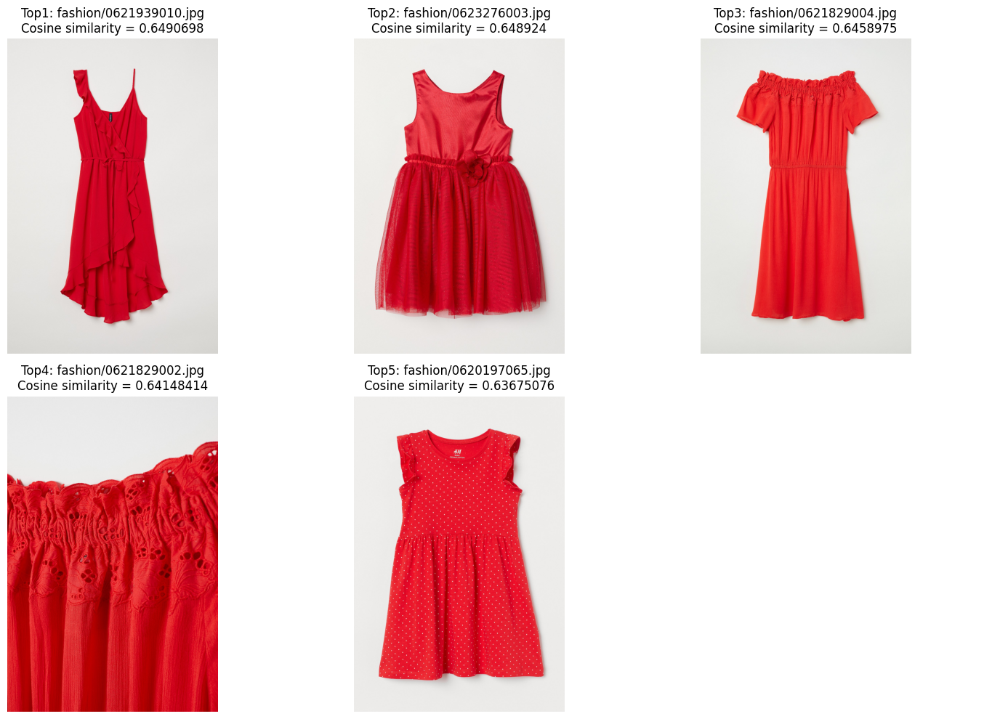

In [21]:
display_images(results)

In [22]:
text = "a blue shirt"

results = visual_search_text(text)

Top 01: fashion/0624645006.jpg with Cosine Similarity = 0.64902
Top 02: fashion/0621735008.jpg with Cosine Similarity = 0.64746
Top 03: fashion/0392938035.jpg with Cosine Similarity = 0.64537
Top 04: fashion/0621523005.jpg with Cosine Similarity = 0.64503
Top 05: fashion/0395127028.jpg with Cosine Similarity = 0.64474


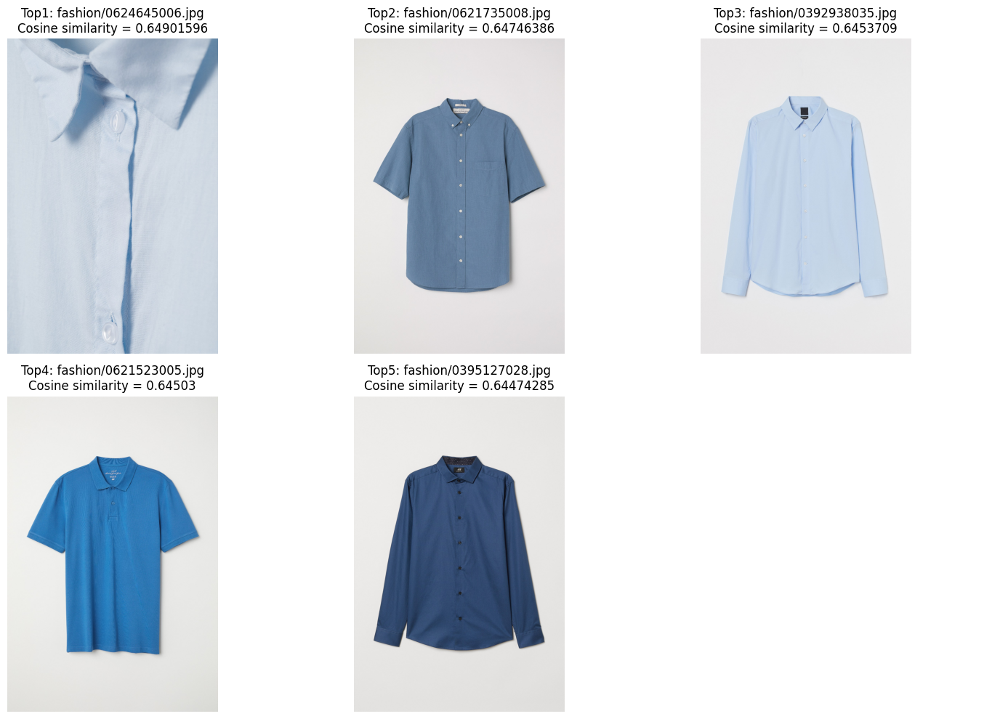

In [23]:
display_images(results)

In [24]:
text = "Articles with sharks on it"

results = visual_search_text(text)

Top 01: fashion/0620851002.jpg with Cosine Similarity = 0.59644
Top 02: fashion/0621973001.jpg with Cosine Similarity = 0.58269
Top 03: fashion/0621752003.jpg with Cosine Similarity = 0.57245
Top 04: fashion/0624124004.jpg with Cosine Similarity = 0.57034
Top 05: fashion/0623397002.jpg with Cosine Similarity = 0.5682


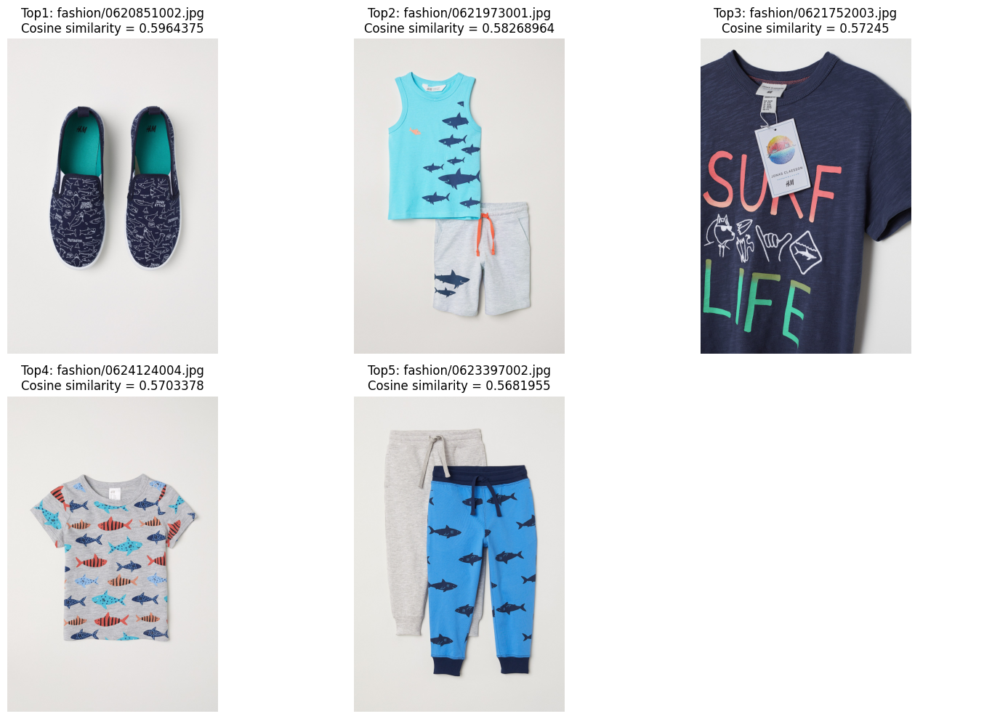

In [25]:
display_images(results)

In [26]:
text = "article with 'we are the future'"

results = visual_search_text(text)

Top 01: fashion/0621768001.jpg with Cosine Similarity = 0.64675
Top 02: fashion/0621766002.jpg with Cosine Similarity = 0.6242
Top 03: fashion/0621767001.jpg with Cosine Similarity = 0.62338
Top 04: fashion/0621766004.jpg with Cosine Similarity = 0.62177
Top 05: fashion/0621767006.jpg with Cosine Similarity = 0.60713


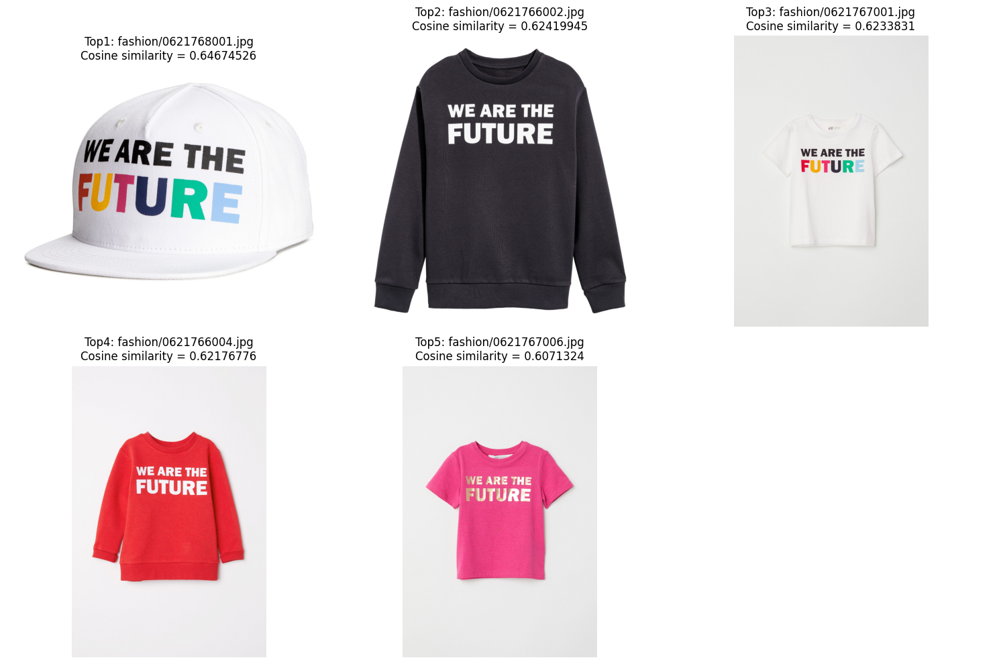

In [27]:
display_images(results)

In [28]:
text = "Montre moi des lunettes de soleil"

results = visual_search_text(text)

Top 01: fashion/0394292006.jpg with Cosine Similarity = 0.61788
Top 02: fashion/0398959003.jpg with Cosine Similarity = 0.60998
Top 03: fashion/0620134001.jpg with Cosine Similarity = 0.60964
Top 04: fashion/0620139003.jpg with Cosine Similarity = 0.60829
Top 05: fashion/0394292002.jpg with Cosine Similarity = 0.60754


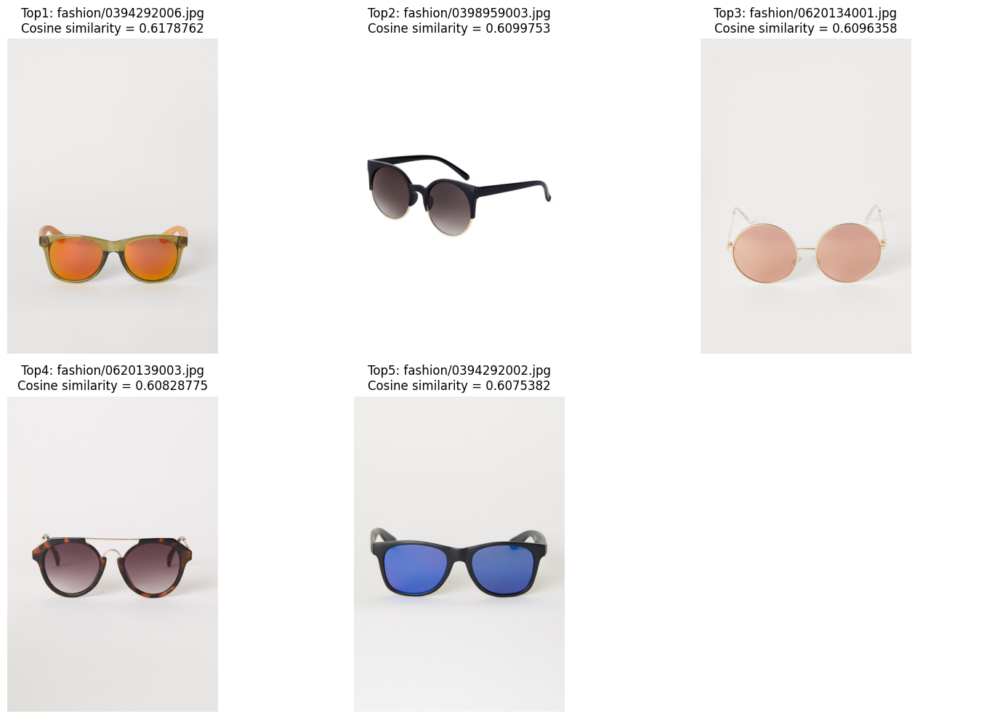

In [29]:
display_images(results)

In [30]:
text = "Ray ban"

results = visual_search_text(text)

Top 01: fashion/0394292002.jpg with Cosine Similarity = 0.60973
Top 02: fashion/0394292001.jpg with Cosine Similarity = 0.60678
Top 03: fashion/0394292008.jpg with Cosine Similarity = 0.60437
Top 04: fashion/0398959003.jpg with Cosine Similarity = 0.59825
Top 05: fashion/0394292006.jpg with Cosine Similarity = 0.59797


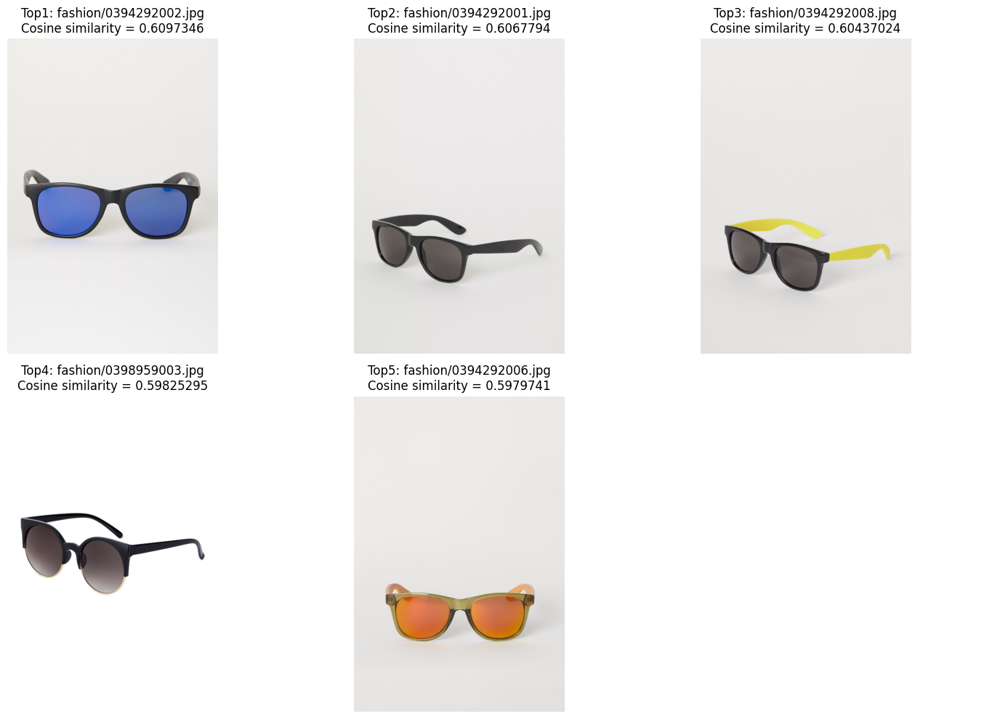

In [31]:
display_images(results)

In [32]:
text = "Show me some articles with NYC"

results = visual_search_text(text)

Top 01: fashion/0622879005.jpg with Cosine Similarity = 0.57459
Top 02: fashion/0622825012.jpg with Cosine Similarity = 0.57336
Top 03: fashion/0621522018.jpg with Cosine Similarity = 0.57032
Top 04: fashion/0622825005.jpg with Cosine Similarity = 0.56906
Top 05: fashion/0621820002.jpg with Cosine Similarity = 0.56631


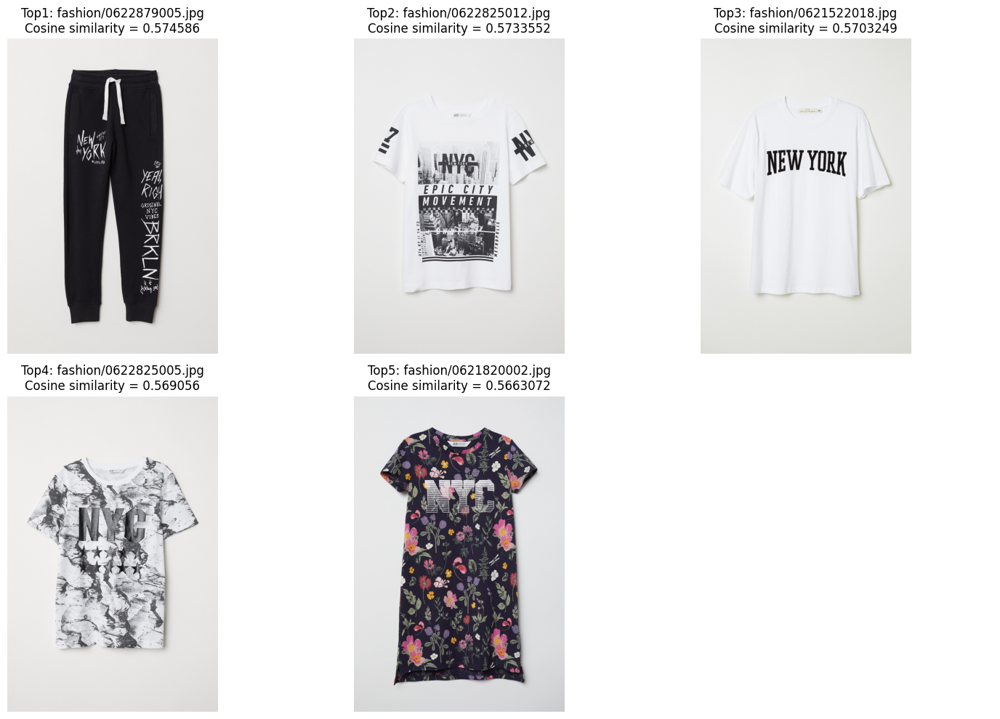

In [33]:
display_images(results)

# Visual search using an image

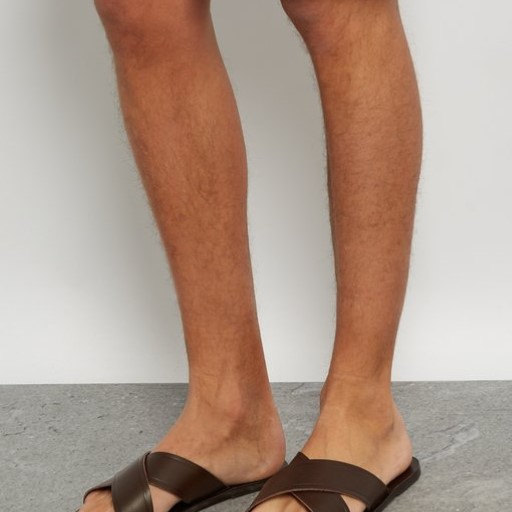

In [34]:
query_image = "images/image1.jpg"

img = Image.open(query_image)
img

In [35]:
results = visual_search_image(query_image)

Top 01: fashion/0621915002.jpg with Cosine Similarity = 0.69257
Top 02: fashion/0621915005.jpg with Cosine Similarity = 0.68248
Top 03: fashion/0623935002.jpg with Cosine Similarity = 0.68021
Top 04: fashion/0623934002.jpg with Cosine Similarity = 0.66976
Top 05: fashion/0623934003.jpg with Cosine Similarity = 0.66523


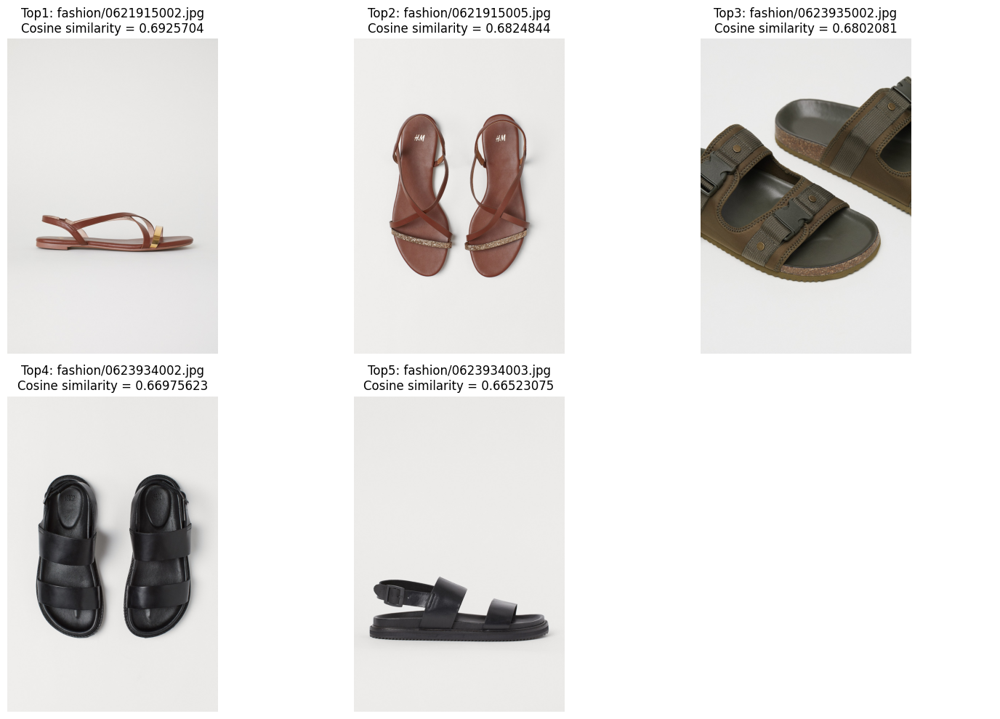

In [36]:
display_images(results)

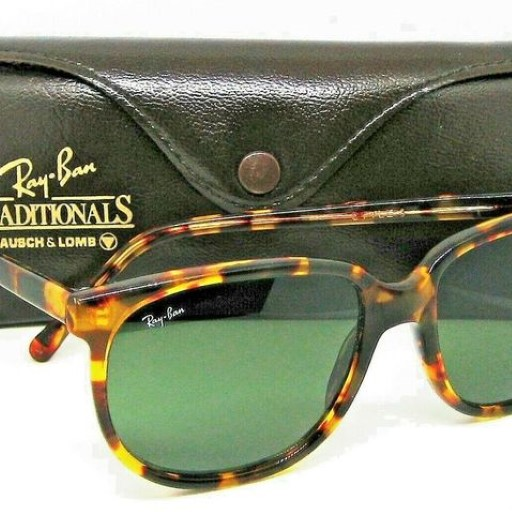

In [37]:
query_image = "images/image2.jpg"

img = Image.open(query_image)
img

In [38]:
results = visual_search_image(query_image, topn=5)

Top 01: fashion/0623350004.jpg with Cosine Similarity = 0.65016
Top 02: fashion/0394292006.jpg with Cosine Similarity = 0.63858
Top 03: fashion/0620139003.jpg with Cosine Similarity = 0.62879
Top 04: fashion/0394292008.jpg with Cosine Similarity = 0.60326
Top 05: fashion/0394292001.jpg with Cosine Similarity = 0.59605


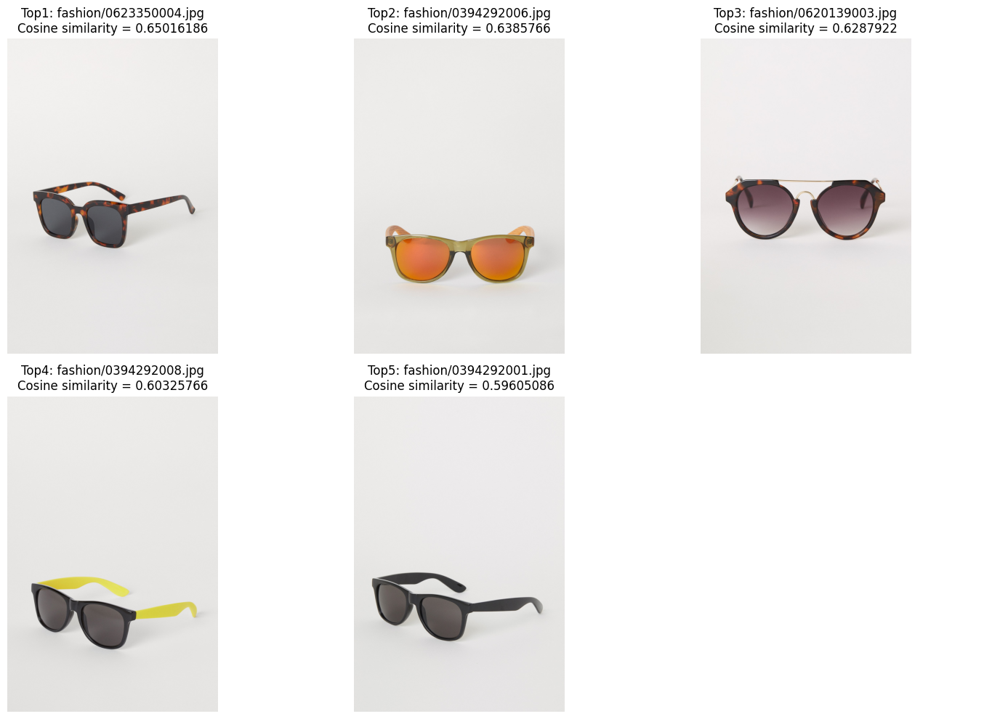

In [39]:
display_images(results)

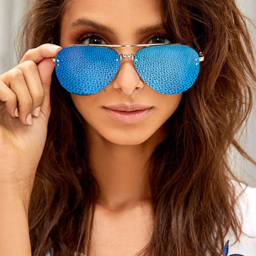

In [40]:
query_image = "images/image3.jpg"

img = Image.open(query_image)
img.resize((256,256))

In [41]:
results = visual_search_image(query_image, topn=10)

Top 01: fashion/0620319001.jpg with Cosine Similarity = 0.6614
Top 02: fashion/0620319010.jpg with Cosine Similarity = 0.64707
Top 03: fashion/0394292002.jpg with Cosine Similarity = 0.63852
Top 04: fashion/0620134001.jpg with Cosine Similarity = 0.62985
Top 05: fashion/0398947002.jpg with Cosine Similarity = 0.62721
Top 06: fashion/0620139006.jpg with Cosine Similarity = 0.62663
Top 07: fashion/0620139003.jpg with Cosine Similarity = 0.61905
Top 08: fashion/0394292006.jpg with Cosine Similarity = 0.60431
Top 09: fashion/0398959003.jpg with Cosine Similarity = 0.59826
Top 10: fashion/0623350003.jpg with Cosine Similarity = 0.59235


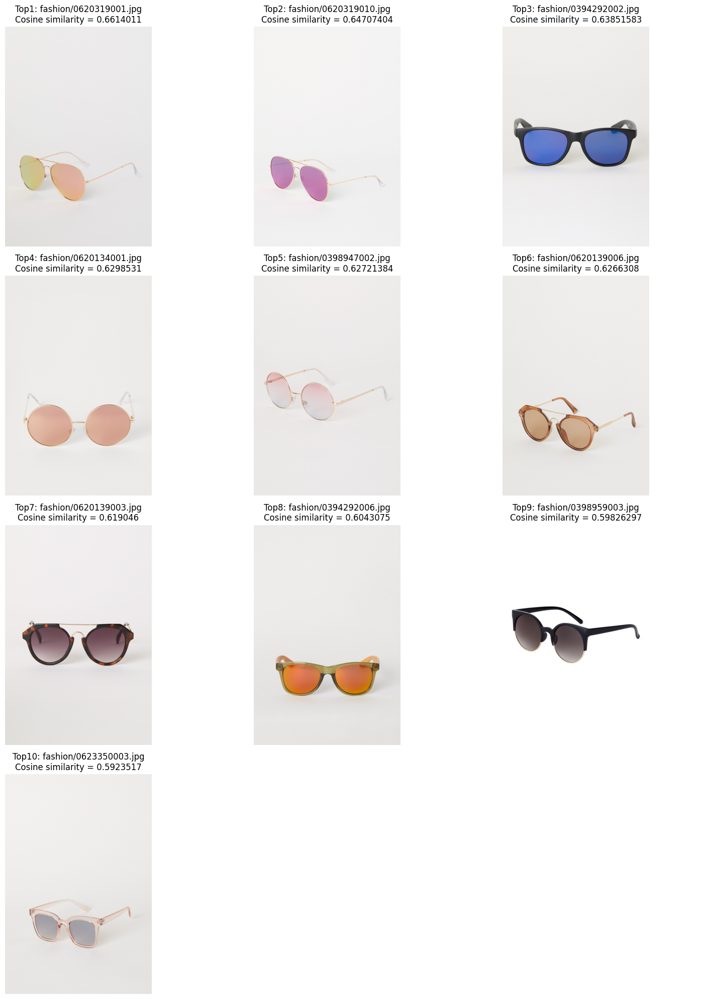

In [42]:
display_images(results)

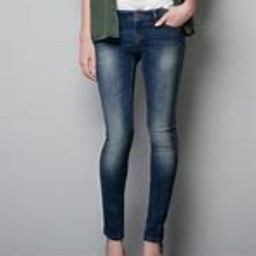

In [43]:
query_image = "images/image4.jpg"

img = Image.open(query_image)
img.resize((256,256))

In [44]:
results = visual_search_image(query_image, topn=10)

Top 01: fashion/0399087015.jpg with Cosine Similarity = 0.7541
Top 02: fashion/0624257009.jpg with Cosine Similarity = 0.74818
Top 03: fashion/0399136034.jpg with Cosine Similarity = 0.74776
Top 04: fashion/0624257017.jpg with Cosine Similarity = 0.74286
Top 05: fashion/0399087042.jpg with Cosine Similarity = 0.74239
Top 06: fashion/0399087030.jpg with Cosine Similarity = 0.74236
Top 07: fashion/0399087029.jpg with Cosine Similarity = 0.74174
Top 08: fashion/0399087014.jpg with Cosine Similarity = 0.741
Top 09: fashion/0624251001.jpg with Cosine Similarity = 0.74093
Top 10: fashion/0624257010.jpg with Cosine Similarity = 0.7403


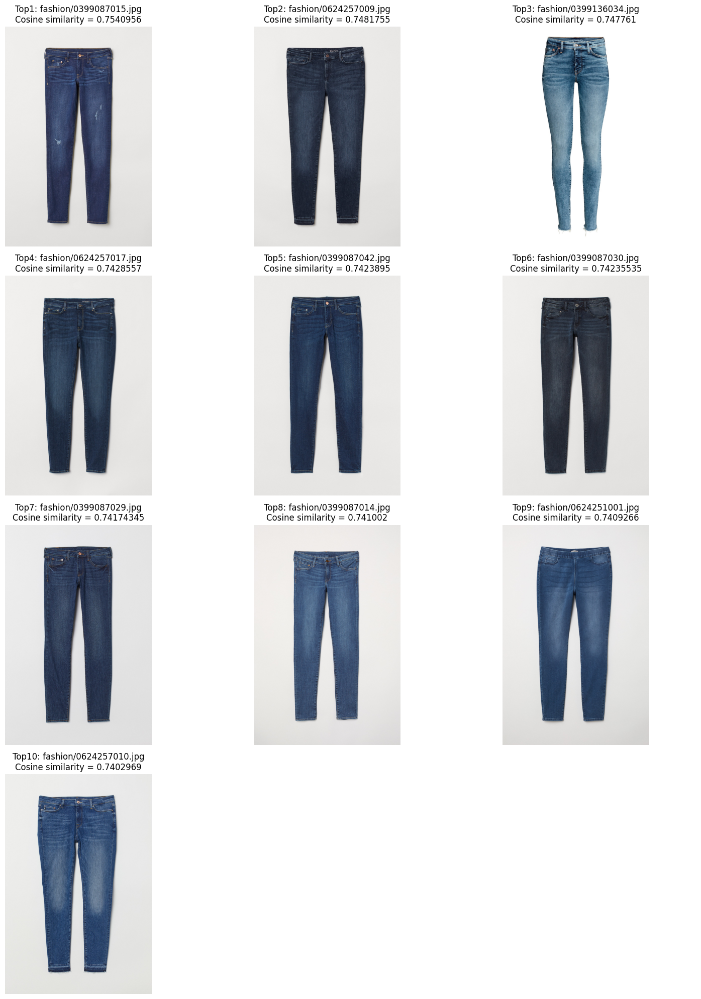

In [45]:
display_images(results)

> Go to the next notebook